# Code for generating figures used in the manuscript

Total number of animals: 399
Total number of clips: 7083
Total number of animals: 13
Total number of clips: 1006


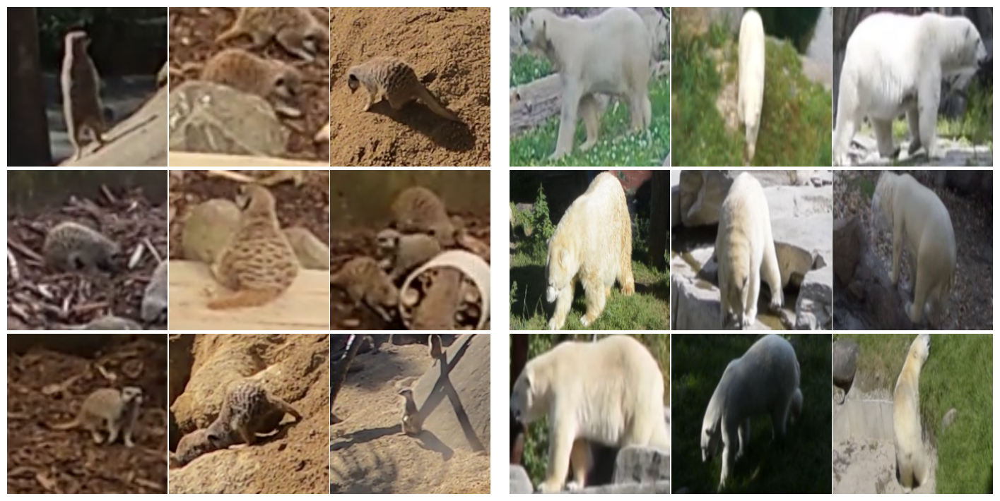

In [32]:
#Fig. 1: Example images of individuals from the two datasets used in this study
from dataloaders.ReID import AnimalClipDataset
import json
import random
import matplotlib.pyplot as plt

def plot_images_from_datasets(dataset1, dataset2, num_images=9):
    # Randomly select images from both datasets
    #idxs1 = random.sample(range(len(dataset1)), num_images)
    #idxs2 = random.sample(range(len(dataset2)), num_images)
    # Use predefined indices
    idxs1 = [1966, 6453, 3587, 385, 6112, 5620, 4555, 2319,803]  
    idxs2 = [96, 394, 192, 516, 262, 460, 977, 723, 634]

    images1 = [dataset1[i][1].detach().cpu().numpy().transpose(1,2,0) for i in idxs1]  # Assuming the dataset returns a tuple (image, label)
    images2 = [dataset2[i][1].detach().cpu().numpy().transpose(1,2,0) for i in idxs2]
    
    # Create a 3x6 grid
    fig = plt.figure(figsize=(18, 9))
    gs = fig.add_gridspec(3, 7, width_ratios=[1, 1, 1, 0.1, 1, 1, 1], wspace=0.01, hspace=0.01)
    
    for i in range(9):
        ax1 = fig.add_subplot(gs[i // 3, i % 3])
        ax1.imshow(images1[i])  # Convert from (C, H, W) to (H, W, C)
        ax1.axis('off')
        #ax1.text(10, 10, str(idxs1[i]), color='white', fontsize=12, ha='left', va='top', backgroundcolor='black')
        
        ax2 = fig.add_subplot(gs[i // 3, 4 + i % 3])
        ax2.imshow(images2[i])
        ax2.axis('off')
        #ax2.text(10, 10, str(idxs2[i]), color='white', fontsize=12, ha='left', va='top', backgroundcolor='black')
    
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.savefig("figures/Animal_examples.eps", bbox_inches='tight', pad_inches=0)
    plt.show()

with open('./Dataset/meerkat_h5files/Cooccurrences.json', 'r') as file:
    m_cooccurrences = json.load(file)

with open('./Dataset/polarbears_h5files/Cooccurrences.json', 'r') as file:
    p_cooccurrences = json.load(file)

meerkat_dataset = AnimalClipDataset("./Dataset/meerkat_h5files/clips/Train/", m_cooccurrences, mode="video_only", num_frames=1)
polarbear_dataset = AnimalClipDataset("./Dataset/polarbears_h5files/clips/Train/", p_cooccurrences, mode="video_only", num_frames=1)

plot_images_from_datasets(meerkat_dataset, polarbear_dataset)

Total number of animals: 399
Total number of clips: 7083
torch.Size([1, 3, 224, 224]) 20 20
torch.Size([20, 20])


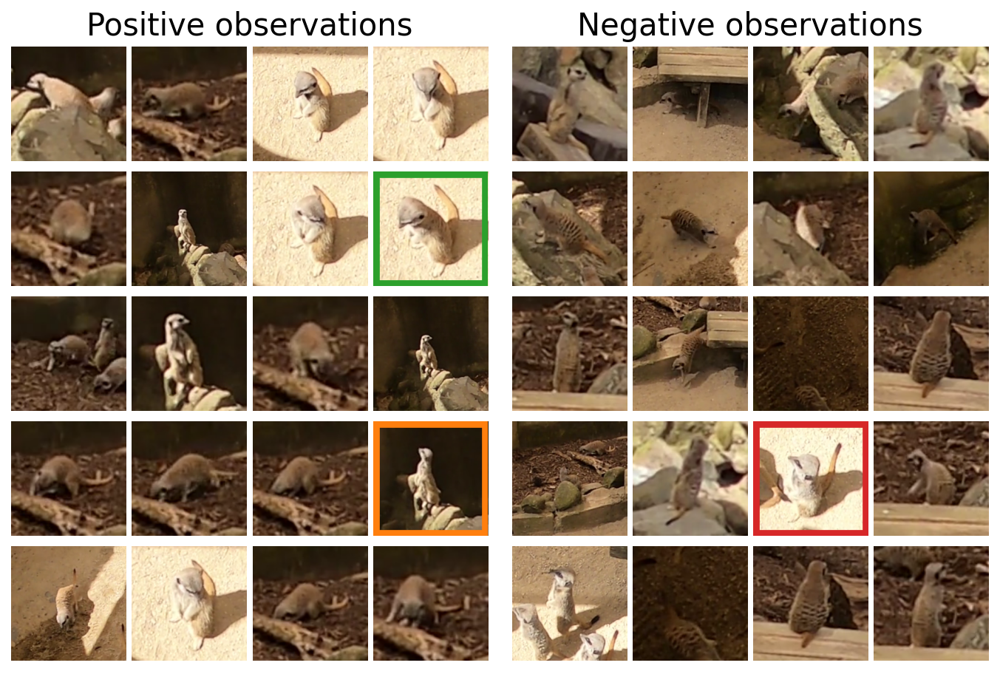

In [24]:
#Fig. 3: Example positive and negative sets.
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import json
import numpy as np
from dataloaders.ReID import AnimalClipDataset
from training_functions.load_model_helper import load_model_from_checkpoint
import torch
import random
from get_anchors.anchor_fn import anchor_fn_hard

# Generate triplet
with open('Dataset/meerkat_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences = json.load(file)

random.seed(35)#Set seed to find a good example
meerkat_dataset = AnimalClipDataset("./Dataset/meerkat_h5files/clips/Train/", cooccurrences, num_frames=1)
dataloader = DataLoader(meerkat_dataset, batch_size=1, shuffle=True)

data_iterator = iter(dataloader)

positive_clips, negative_clips = next(data_iterator)
anchor_clip = positive_clips[0]

print(anchor_clip.shape, len(positive_clips), len(negative_clips))

# Run triplets through models
model = load_model_from_checkpoint("results/full_model_training/vgg-16_meerkat/checkpoint_epoch_5.pt")
model.to("cpu")
model.eval()

similarity_measure = lambda anchor, other: torch.sqrt(torch.sum((anchor - other) ** 2, dim=-1))
anchor_img, positive_img, negative_img = anchor_fn_hard(model, positive_clips, negative_clips, "cpu", similarity_measure=similarity_measure)

anchor_img = anchor_img[:,:,:].cpu().numpy().transpose(1,2,0)
positive_img = positive_img[:,:,:].cpu().numpy().transpose(1,2,0)
negative_img = negative_img[:,:,:].cpu().numpy().transpose(1,2,0)

# Display figure
fig, ((ax1),(ax2)) = plt.subplots(1, 2, figsize=(9, 6), dpi=150)
ax1.axis('off')
ax2.axis('off')

gs2 = gridspec.GridSpecFromSubplotSpec(5, 4, subplot_spec=ax1)
axes = []
for i, img in enumerate(positive_clips):
    ax = fig.add_subplot(gs2[i // 4, i % 4])
    im = img[0,:,:,:].cpu().numpy()
    im = im.transpose(1,2,0)
    ax.imshow(im)
    ax.axis('off')
    if np.array_equal(im, anchor_img):
        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:green', facecolor='none', transform=ax.transData)
        ax.add_patch(rect)
    if np.array_equal(im, positive_img):
        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:orange', facecolor='none', transform=ax.transData)
        ax.add_patch(rect)
    axes += [ax]
ax1.set_title("Positive observations", fontsize=20)

#plt.subplots_adjust(wspace=0.05, hspace=0.05)

gs3 = gridspec.GridSpecFromSubplotSpec(5, 4, subplot_spec=ax2)
n_imgs_section3 = len(negative_clips)
axes = []
for i, img in enumerate(negative_clips):
    ax = fig.add_subplot(gs3[i // 4, i % 4])
    im = img[0,:,:,:].cpu().numpy()
    im = im.transpose(1,2,0)
    ax.imshow(im)
    ax.axis('off')
    if np.array_equal(im, negative_img):
        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:red', facecolor='none', transform=ax.transData)
        ax.add_patch(rect)
    axes += [ax]
ax2.set_title("Negative observations", fontsize=20)

plt.subplots_adjust(left=0.01, right=0.99, top=0.94, bottom=0.01, wspace=0.05, hspace=0.05)

plt.savefig("./figures/meerkat_triplets.eps")
plt.show()
plt.close()

Total number of animals: 13
Total number of clips: 280
Total number of animals: 87
Total number of clips: 1800
280
1800


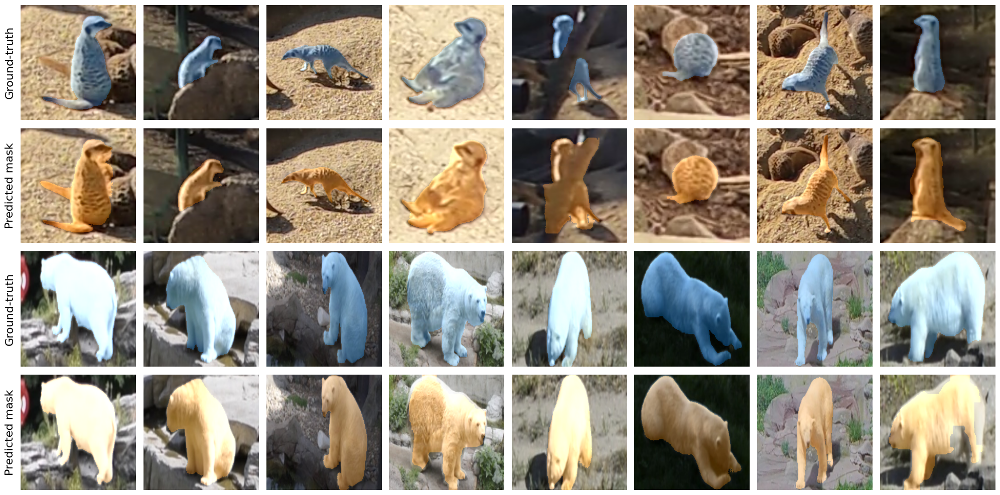

In [31]:
#Fig. 5: Examples of the segmentation results
import numpy as np
import os
import cv2
from dataloaders.ReID import AnimalClipDataset
import matplotlib.pyplot as plt
import pickle
import json
import gzip

with open('./Dataset/meerkat_h5files/masks/Meerkat_masks.pkl', 'rb') as f:
    masks_MK = pickle.load(f)
with open('./Dataset/polarbears_h5files/masks/PB_masks.pkl', 'rb') as f:
    masks_PB = pickle.load(f)

with open('./Dataset/meerkat_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_MK = json.load(file)

with open('./Dataset/polarbears_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_PB = json.load(file)

PB_dataset = AnimalClipDataset("./Dataset/polarbears_h5files/clips/Test/", cooccurrences_PB, num_frames=20, mode="video_only")
Meerkat_dataset = AnimalClipDataset("./Dataset/meerkat_h5files/clips/Test/", cooccurrences_MK, num_frames=20, mode="video_only")

print(len(PB_dataset))
print(len(Meerkat_dataset))

# Create the figure and subplots
fig, axs = plt.subplots(4, 8, figsize=(20, 10))

gt_colour = np.asarray([255, 127, 14]).reshape(1,1,-1)
pred_colour = np.asarray([14, 127, 255]).reshape(1,1,-1)

# Function to plot a random frame from the masks and datasets
def plot_frames(axs, masks_dict, dataset, selected_clips, row_idx, gt_masks):
    for i, (idx,frame_num) in enumerate(selected_clips):
        output = dataset.load_clip(idx)[frame_num].numpy().transpose(1,2,0)*255
        output = output.astype(np.uint8)

        #Plot the ground truth
        predicted_mask = gt_masks[idx][str(frame_num).zfill(2)]
        color_mask = ((255*predicted_mask).reshape(224, 224, 1) * gt_colour).astype(np.uint8)
        output_pred = cv2.addWeighted(output, 1, color_mask, 0.3, 1)
        axs[row_idx, i].imshow(output_pred)

        #Plot the prediction
        predicted_mask = masks_dict[idx][frame_num]
        color_mask = ((255*predicted_mask).reshape(224, 224, 1) * pred_colour).astype(np.uint8)
        output_pred = cv2.addWeighted(output, 1, color_mask, 0.3, 1)

        axs[row_idx + 1, i].imshow(output_pred)

        axs[row_idx + 1, i].axis('off')
        axs[row_idx, i].axis('off')

# Plot the Meerkat data
clips_to_use = [
    ("0845_0189", 11),
    ("0847_0279", 16),
    ("0847_0387", 13),
    ("1062_0171", 2),
    ("0937_0306", 8),
    ("0137_0259", 5),
    ("0854_0549", 14),
    ("1076_0207", 10),
]
with gzip.open("segmentation/ground_truth_masks/meerkat_GT_masks.pkl", 'rb') as f:
    gt_masks = pickle.load(f)
plot_frames(axs, masks_MK, Meerkat_dataset, clips_to_use, 0, gt_masks)

# Plot the Polar Bear data
clips_to_use = [
    ("003_102", 11),
    ("003_116", 16),
    ("004_099", 13),
    ("006_099", 19),
    ("011_086", 2),
    ("009_109", 8),
    ("001_099", 5),
    ("011_092", 10),
]
with gzip.open("segmentation/ground_truth_masks/polarbear_GT_masks.pkl", 'rb') as f:
    gt_masks = pickle.load(f)
plot_frames(axs, masks_PB, PB_dataset, clips_to_use, 2, gt_masks)

axs[0, 0].text(-0.05, 0.5, "Ground-truth", fontsize=16, va='center', ha='right', rotation=90, transform=axs[0, 0].transAxes)
axs[1, 0].text(-0.05, 0.5, "Predicted mask", fontsize=16, va='center', ha='right', rotation=90, transform=axs[1, 0].transAxes)
axs[2, 0].text(-0.05, 0.5, "Ground-truth", fontsize=16, va='center', ha='right', rotation=90, transform=axs[2, 0].transAxes)
axs[3, 0].text(-0.05, 0.5, "Predicted mask", fontsize=16, va='center', ha='right', rotation=90, transform=axs[3, 0].transAxes)

# Adjust layout and display
plt.tight_layout()
plt.savefig("figures/Segmentation_results.eps")
plt.show()

Total number of animals: 13
Total number of clips: 280
Total number of animals: 87
Total number of clips: 1800


C:\Users\mrog173\AppData\Roaming\Python\Python311\site-packages\torch\storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))


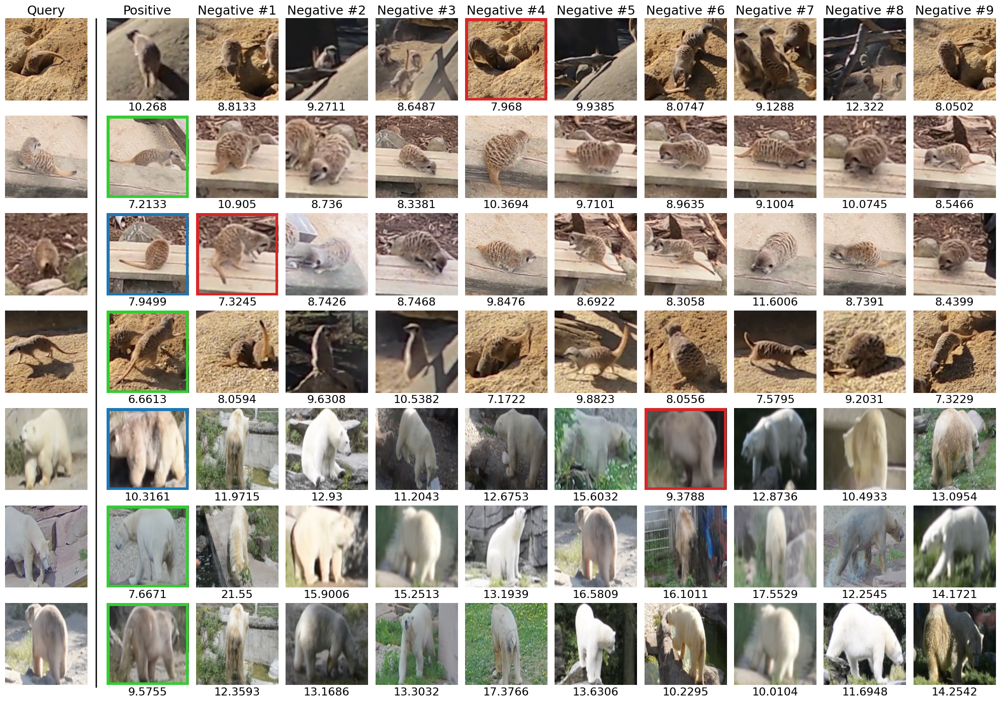

In [8]:
#Fig. 6 Examples of incorrect (red) and correct (green) re-identifications of a query clip (left-most column) using the best RoVF model.
import numpy as np
import os
import cv2
from dataloaders.ReID import AnimalClipDataset
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd

def open_pickle(file_path):
    # Open the file in binary read mode
    with open(file_path, 'rb') as file:
        # Load the object from the file
        data = pickle.load(file)
        data = {os.path.basename(key): value for key, value in data.items()}
    return data

def indices_of_smallest(distances, banned_idx):
    #Sort indices and distances, ignoring the query
    sorted_indices = np.argsort(distances)
    sorted_indices = sorted_indices[sorted_indices != banned_idx]
    sorted_distances = distances[sorted_indices]
    
    # Find the lowest 3 distinct values
    unique_values = []
    unique_indices = []
    
    for i in range(len(sorted_distances) - 1):
        if sorted_distances[i] != sorted_distances[i + 1]:
            unique_values.append(sorted_distances[i])
            unique_indices.append(sorted_indices[i])
        if len(unique_values) == 3:
            break
    
    # Check if the next value after the last unique one is the same (indicating a tie)
    if len(unique_values) == 3 and i+1 < len(sorted_distances):
        if sorted_distances[i+1] == sorted_distances[i]:
            # There's a tie for the last included value, so we remove any tied values
            last_val = unique_values[-1]
            return [idx for idx, val in zip(unique_indices, unique_values) if val != last_val]
    
    return unique_indices

def load_clip(dataset, idx, frame):
    output = dataset.load_clip(idx)[frame].numpy().transpose(1,2,0)*255
    output = output.astype(np.uint8)
    return output

def plot_examples(selected_examples, polarbears, meerkats, ln, filename, iterator=[0]):
    meerkat_df = pd.read_csv("Dataset/meerkat_h5files/Precomputed_test_examples_meerkat.csv")
    polarbear_df = pd.read_csv("Dataset/polarbears_h5files/Precomputed_test_examples_polarbear.csv")

    best_polarbear_embeddings = open_pickle("results/embeddings/checkpoint_epoch_3_embeddings_mask_PB.pkl")
    best_meerkat_embeddings = open_pickle("results/embeddings/checkpoint_epoch_1_embeddings_mask_meerkat.pkl")
    
    fig, axes = plt.subplots(len(selected_examples), 12, figsize=(20, len(selected_examples)*2), gridspec_kw={'width_ratios': [1, 0.05, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]})
    
    for frame in iterator:
        titles = ["Query", "Positive"] + ["Negative #"+str(i) for i in range(1,10)]
        
        for idx, (ds, vid_id) in enumerate(selected_examples):
            axes[idx,1].axis('off')
            if ds == 0:
                row = meerkat_df.iloc[vid_id]
                data = best_meerkat_embeddings
                video_source = meerkats
            elif ds == 1:
                row = polarbear_df.iloc[vid_id]
                data = best_polarbear_embeddings
                video_source = polarbears
            
            #Get embeddings and videos for a particular row
            row_embeddings = [data[i].cpu().numpy() for i in row]
            embeddings = np.stack([t for t in row_embeddings])          #11
            videos = [load_clip(video_source, i, frame) for i in row]   #11

            # Compute the Euclidean distance between each row
            distances = np.sqrt(((embeddings[:, np.newaxis, :] - embeddings[np.newaxis, :, :]) ** 2).sum(axis=2))

            #Get indices of the closest embeddings for both test cases and remove the query
            closest_indices_ranked_0 = indices_of_smallest(distances[0], 0)
            closest = closest_indices_ranked_0[0]
            top_three = [closest_indices_ranked_0[1], closest_indices_ranked_0[2]]
            distances = distances[0][1:]
            highlight_index = closest
            
            for j in range(11):
                i = j
                if j >= 1:
                    i = j + 1
                axes[idx,i].imshow(videos[j])
                axes[idx,i].axis('off')  # Hide the axis
                if idx == 0: # Plot the titles above clips
                    axes[idx,i].set_title(titles[j], fontsize=18)
                if i > 0: # Only plot after the query video
                    axes[idx,i].text(0.5, -0.12, str(round(distances[j-1],4)), transform=axes[idx,i].transAxes, ha="center", fontsize=16)  # Distance underneath
                
                # Draw a green box around the top 1
                if j == highlight_index:
                    if j == 1:
                        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='limegreen', facecolor='none', transform=axes[idx,i].transData)
                    else:
                        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:red', facecolor='none', transform=axes[idx,i].transData)
                    axes[idx,i].add_patch(rect)
                if j in top_three:
                    if j == 1:
                        rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:blue', facecolor='none', transform=axes[idx,i].transData)
                    #else:
                        #rect = plt.Rectangle((-0.5, -0.5), 224, 224, linewidth=8, edgecolor='tab:orange', facecolor='none', transform=axes[idx,i].transData)
                        axes[idx,i].add_patch(rect)
                

            line = plt.Line2D(ln[0],ln[1], color="k", linewidth=1)
            fig.add_artist(line)

        plt.tight_layout()
        plt.savefig(filename,bbox_inches='tight')
        plt.show()

#Use predefined selected test cases for the figure
selected_examples = [
    (0, 1),
    (0, 13),
    (0, 45),
    (0, 58),
    (1, 66),
    (1, 2),
    (1, 58)
]

#iterator = range(0,20)

with open('./Dataset/meerkat_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_MK = json.load(file)

with open('./Dataset/polarbears_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_PB = json.load(file)

PB_dataset = AnimalClipDataset("./Dataset/polarbears_h5files/clips/Test/", cooccurrences_PB, num_frames=20, mode="video_only")
Meerkat_dataset = AnimalClipDataset("./Dataset/meerkat_h5files/clips/Test/", cooccurrences_MK, num_frames=20, mode="video_only")

ln = [(.098,.098), (.02,.97)]
filename = "figures/embeddings.eps"
plot_examples(selected_examples, PB_dataset, Meerkat_dataset, ln, filename)

Total number of animals: 13
Total number of clips: 280
Total number of animals: 87
Total number of clips: 1800


C:\Users\mrog173\AppData\Roaming\Python\Python311\site-packages\torch\storage.py:414: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(io.BytesIO(b))


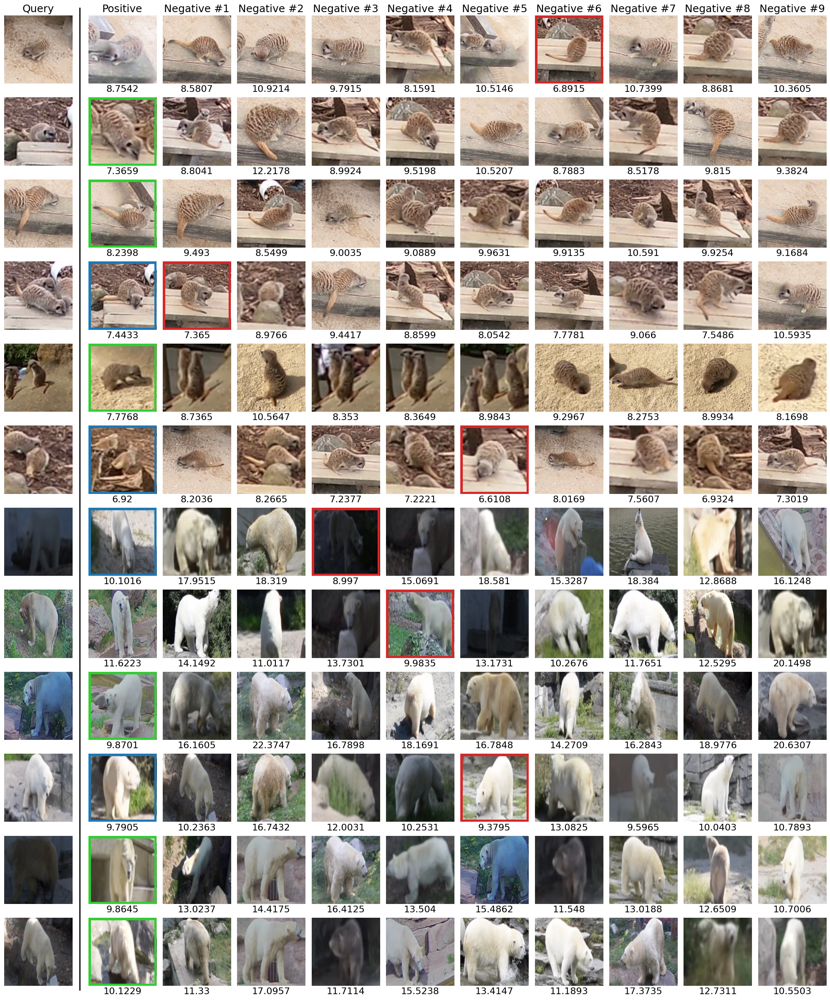

In [11]:
#Supplementary figure: Examples of incorrect (red) and correct (green) re-identifications of a query clip (left-most column) using the best RoVF model.
selected_examples = [
    (0, 7),
    (0, 16),
    (0, 31),
    (0, 49),
    (0, 75),
    (0, 76),
    (1, 56),
    (1, 7),
    (1, 5),
    (1, 75),
    (1, 45),
    (1, 28),
]

with open('./Dataset/meerkat_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_MK = json.load(file)

with open('./Dataset/polarbears_h5files/Cooccurrences.json', 'r') as file:
    cooccurrences_PB = json.load(file)

PB_dataset = AnimalClipDataset("./Dataset/polarbears_h5files/clips/Test/", cooccurrences_PB, num_frames=20, mode="video_only")
Meerkat_dataset = AnimalClipDataset("./Dataset/meerkat_h5files/clips/Test/", cooccurrences_MK, num_frames=20, mode="video_only")

filename = "figures/supplementary.pdf"
ln = [(.098,.098), (.01,.99)]
plot_examples(selected_examples, PB_dataset, Meerkat_dataset, ln, filename)